# Sprint 6 Project.

## Introductions
Preliminary data set analysis.
Testing hypotheses about the structure of the used car market.

## Import

In [36]:
import pandas as pd
import plotly.express as px

#Don't import Streamlit into a notebook! This causes Plotly graphs to turn black.
#import streamlit as st 

#import altair

import urllib.request
from PIL import Image

### Don't import Streamlit into a notebook! This causes Plotly graphs to turn black.


In [37]:
df=pd.read_csv(r'C:\Users\alexn\OneDrive\Документы\GitHub\Car-Advertisement--Project\vehicles_us.csv')
df.head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


Сhecking for the duplicates

In [39]:
df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


In [40]:
df2=df.drop_duplicates()
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


Checking for the missing values

In [41]:
print(df.isna().sum()) 

price               0
model_year       3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64


Deleting records with the missing values in 'model_year' and 'odometer'.

In [42]:
df = df.dropna(subset=['model_year', 'odometer'])
print(df.isna().sum()) 

price               0
model_year          0
model               0
condition           0
cylinders        4144
fuel                0
odometer            0
transmission        0
type                0
paint_color      7257
is_4wd          20412
date_posted         0
days_listed         0
dtype: int64


One should not delete more than 10% of data. The less we drop, the better. In the line df.dropna(subset=['model_year', 'odometer']) you deleted 20%, which is definitely not great.

+++ This is probably true in many cases.
But in my case, I deleted these lines so that in the project, when simultaneously filtering by several criteria, graph errors would not occur when, for example, for a given car brand and mileage,there are  only NaN for the year remain.

Try to replace Nan-s in at least one of the columns using groupby method. For instance, we can define the number of cylinders with a high confidence level if we group the data by model and model's year and then take a median number of cylinders.

+++ я не понимаю, какой смысл в медианном количестве цилиндров? зачем нужна эта "средняя температура по больнице"? нужно знать именно точное количество цилиндров, т.к. это указывает на модификацию автомобиля, от котрой зависит его цена. 

In [43]:
df.describe(include='all')

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
count,40563.000000,40563.000000,40563,40563,36419.000000,40563,40563.000000,40563,40563,33306,20151.0,40563,40563.000000
unique,NaN,NaN,99,6,NaN,5,NaN,3,13,12,NaN,354,NaN
top,NaN,NaN,ford f-150,excellent,NaN,gas,NaN,automatic,truck,white,NaN,2019-03-11,NaN
freq,NaN,NaN,2217,19514,NaN,37270,NaN,36910,9778,7916,NaN,150,NaN
mean,12171.165348,2009.744422,NaN,NaN,6.132596,NaN,115425.444099,NaN,NaN,NaN,1.0,NaN,39.646353
std,10047.283848,6.276535,NaN,NaN,1.659646,NaN,65219.802462,NaN,NaN,NaN,0.0,NaN,28.137084
min,1.000000,1908.000000,NaN,NaN,3.000000,NaN,0.000000,NaN,NaN,NaN,1.0,NaN,0.000000
25%,5000.000000,2006.000000,NaN,NaN,4.000000,NaN,70000.000000,NaN,NaN,NaN,1.0,NaN,19.000000
50%,9000.000000,2011.000000,NaN,NaN,6.000000,NaN,113000.000000,NaN,NaN,NaN,1.0,NaN,33.000000
75%,16900.000000,2014.000000,NaN,NaN,8.000000,NaN,155000.000000,NaN,NaN,NaN,1.0,NaN,53.000000


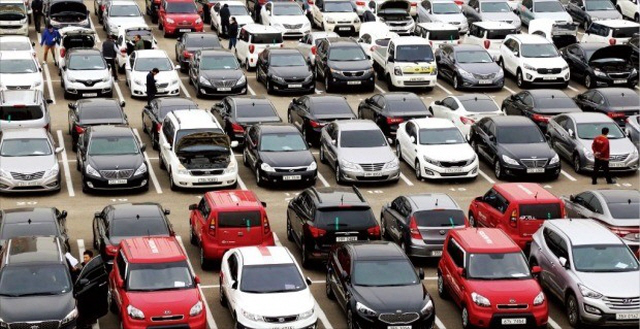

In [44]:
urllib.request.urlretrieve(
  'http://koreabizwire.com/wp/wp-content/uploads/2018/11/AA.16823048.1.jpg',
   "my_img.jpg")
  
img = Image.open("my_img.jpg")
img


In [61]:
#actual_range=list(range(1,111))
#print(actual_range)
#filtered_df=df[df.price.isin(actual_range)]
#print(filtered_df)

In [46]:
#data=data.insert(1, "D", 5)
#df["cnt"] = 1
df["brand"] = df['model'].str.split().str[0]
brands=df.brand.unique()
print(brands)
brands.sort()
print(brands)
df[['brand', 'model']].head(10)

['bmw' 'hyundai' 'chrysler' 'toyota' 'honda' 'kia' 'chevrolet' 'ram' 'gmc'
 'jeep' 'ford' 'nissan' 'subaru' 'dodge' 'acura' 'cadillac' 'volkswagen'
 'buick']
['acura' 'bmw' 'buick' 'cadillac' 'chevrolet' 'chrysler' 'dodge' 'ford'
 'gmc' 'honda' 'hyundai' 'jeep' 'kia' 'nissan' 'ram' 'subaru' 'toyota'
 'volkswagen']


,brand,model
0,bmw,bmw x5
2,hyundai,hyundai sonata
4,chrysler,chrysler 200
5,chrysler,chrysler 300
6,toyota,toyota camry
7,honda,honda pilot
8,kia,kia sorento
9,honda,honda pilot
10,chevrolet,chevrolet silverado 1500
11,honda,honda accord


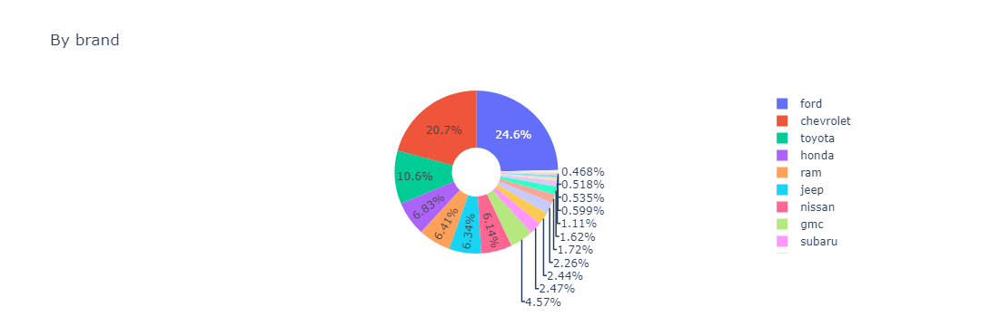

In [47]:
fig = px.pie(df,  names='brand', title='By brand', hole=.3)
fig

Americans and Japanies brands a leading.

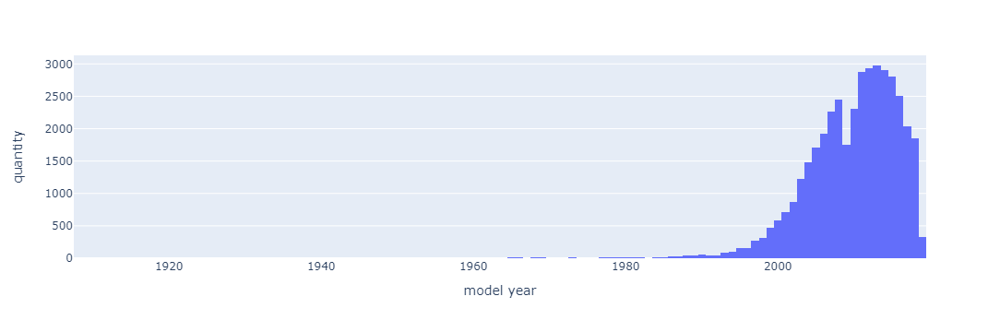

In [62]:
fig1 = px.histogram(df, x="model_year",labels={'model_year': 'model year'}).update_layout(yaxis_title="quantity")
fig1

Mostly all cars are from 2000 to 2019

я добавил тут подписи осей, и я сдела это еще раньше в приложени.
извините, но мне кажется, вы придираетесь.
ноутбук не предназначен для конечного пользователя. тот, кто его сможет запустить и проанализировать - это аналитик, который знает python, знает plotly, знаком со статистикой и т.п. и который понимает, что такое count, и что такое model_year.

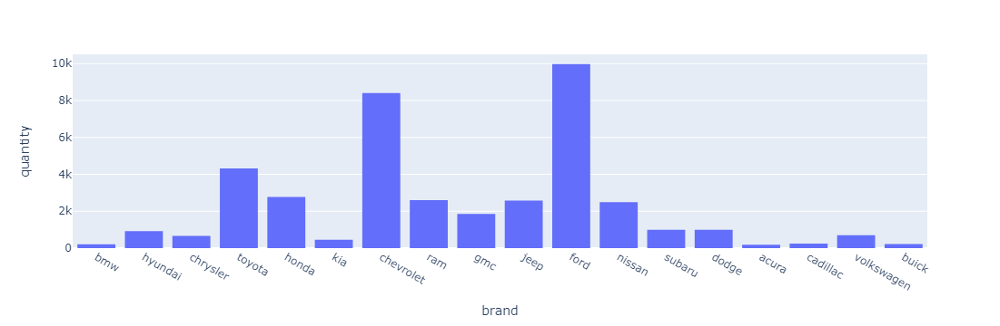

In [56]:
fig1 = px.histogram(df, x="brand").update_layout(yaxis_title="quantity")
fig1

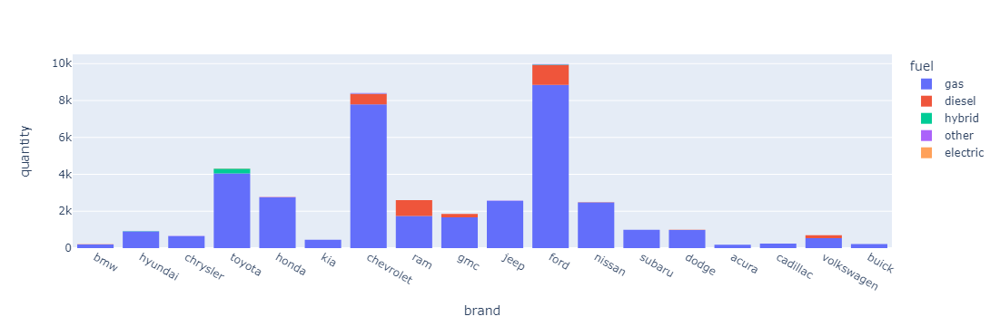

In [57]:
fig1 = px.histogram(df, x="brand", color='fuel').update_layout(yaxis_title="quantity")
fig1

Mostly all cars have a gasoline engine.

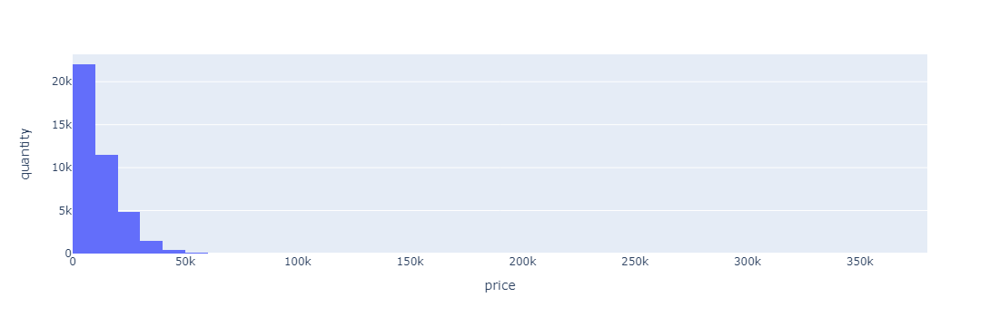

In [58]:
fig1 = px.histogram(df, x="price", nbins=50).update_layout(yaxis_title="quantity")
fig1

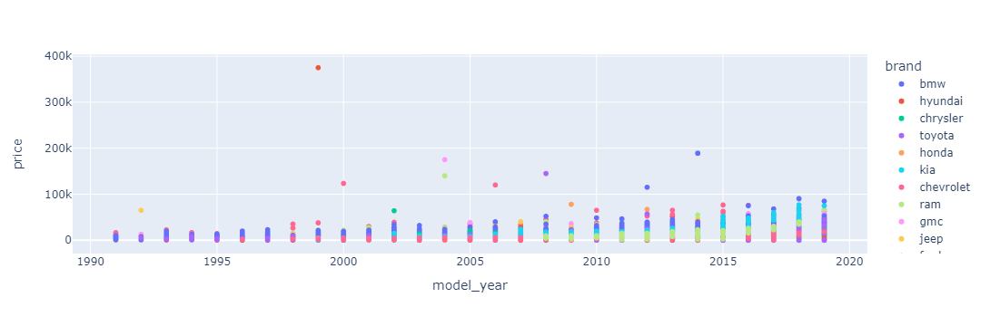

In [52]:
fig2 = px.scatter(df[1990 < df['model_year']], x="model_year", y="price", color='brand')
fig2

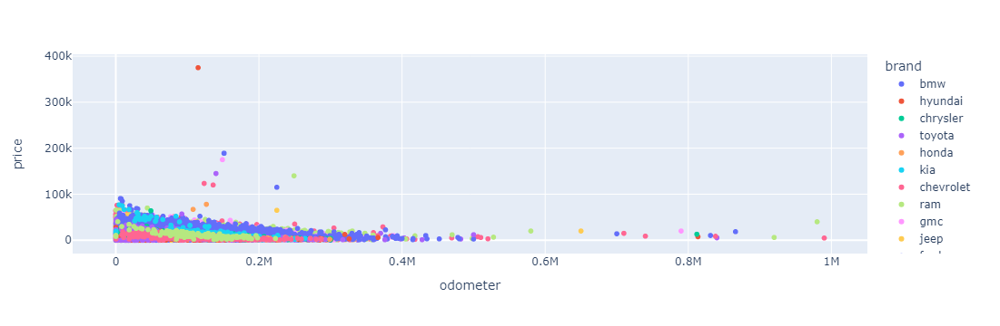

In [53]:
fig2 = px.scatter(df[df['model_year']>1990], x="odometer", y="price", color='brand')
fig2

In [63]:
#fig4 = px.density_heatmap(df, x="odometer", y="price")
#fig4

In [64]:
#fig4 = px.density_heatmap(df, x="odometer", y="price", nbinsx=50, nbinsy=50, color_continuous_scale="Viridis")
#fig4

Will not include this charts into the application.

## Overall conclusion


Using this data set, we can create an application that will visualize the structure of the used car market, namely:
* distribution by brand,
* distribution by year,
* analysis of the dependence of price on car mileage.